In [19]:
import numpy as np
import scipy

from pprint import pprint
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation
#from scipy.linalg import expm

import time
import pickle
from pasqal_cloud import SDK
from pasqal_cloud.device import EmulatorType

import pulser
import qutip
from pulser import Pulse, Sequence, Register
from pulser_simulation import QutipEmulator
from pulser.waveforms import RampWaveform, ConstantWaveform
from pulser.devices import Chadoq2, MockDevice

## Cloud setup

In [20]:

project_id = "1d856b2d-58b1-4602-ad8a-e18f2db96bc3"
username = ""
password = ""

CLOUD = False

## Graph MOF extraction

In [21]:
def MOF_reader(mol_str):
   with open('dataset_trimmed/'+mol_str+'_txt') as file:
    lines = file.readlines()
    N = len(lines)-1
    d = float(lines[0])
    plane_coords = np.array([lines[i].split() for i in range(1,N+1)], float)
    
    return d, plane_coords

In [22]:

# Caution: Changing the MOF variable to another one than "TEST" will display you the molecular projection. 
# However the simulation might take too much time
#MOF = "MOCJEU"


# The following test takes ~10 minutes to run. This is mainly due to the very close atomic distance setting 
# where the off-diagonal terms from the Rydberg interaction are very important in the hamiltonian
# (the more intense the Rydberg interactions are, the slower the simulation is)
MOF = "TEST"


In [23]:

if(MOF!="TEST"):
    d,coords = MOF_reader(MOF)
    coords
    n = len(coords)
    def graph_desc(rNN):
        G1 = [rNN*np.array([c[0],c[1]]) for c in coords/d/3]
        return G1
else:
    n = 6
    def graph_desc(rNN):
        w = np.exp(1j*2*np.pi/(n))
        G1 = [[rNN/(2*np.sin(np.pi/(n)))*(w**i).real,rNN/(2*np.sin(np.pi/(n)))*(w**i).imag] for i in range(n)]
        #G1 = [[rNN*i, 0] for i in range(6)]
        return G1

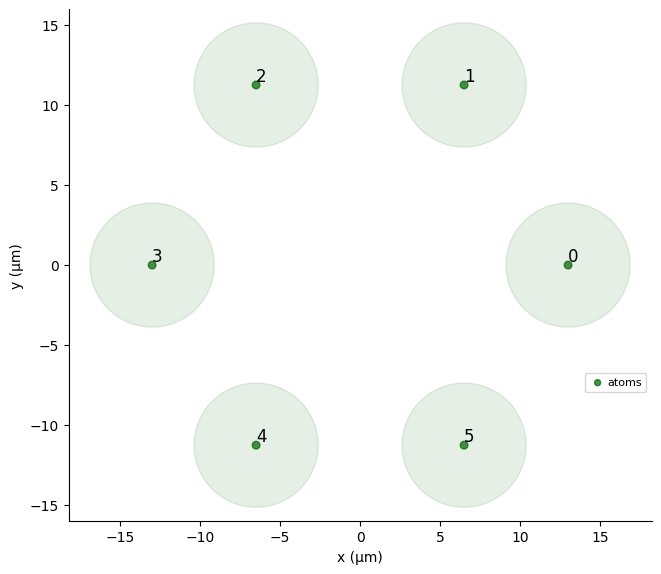

In [24]:

G1 = graph_desc(13)


        
def excitation(j, total_sites):
    """The |0><0| projector operator on site j."""
    prod = [qutip.qeye(2) for _ in range(total_sites)]
    prod[j] = (qutip.qeye(2) + qutip.sigmaz()) / 2
    return qutip.tensor(prod)


def excitation2(l, n = 6):
    """The |0><0| projector operator on site j."""
    prod = [qutip.qeye(2) for _ in range(n)]
    for j in l:
        prod[j] = (qutip.qeye(2) + qutip.sigmaz()) / 2
    return qutip.tensor(prod)



excited = excitation2([0,1,2,3,4,5],n)

excited = excitation(0,n)

# Illustrative variables
Omega = 1   * 2*np.pi
U = 138e4

qubits1 = dict(enumerate(G1))
reg1 = Register(qubits1)
reg1.draw(blockade_radius=(U/Omega)**(1/6), draw_half_radius=True, draw_graph=True)

# Simulation

In [25]:
K = 100
rNN_vec = np.linspace(25,2.,K)
M = 10000
sampling_rate = 1/100


In [26]:
if(CLOUD):
    print("You are about to launch jobs on the cloud, continue ?")
    x = input()
    if(x=="y"):
        print('Good')
    else:
        raise SystemExit(0)


In [27]:
datafolder_Time_state_Evolution = "./dataset_trimmed/Time_evolution/"
datafolder_FFT_obs_Evolution = "./dataset_trimmed/FFT_feature/"



L = int(sampling_rate*M)
T = np.linspace(0,int(M/1000),L)
#STATE = np.zeros((K,L,2**n), dtype=complex)
STATE = []


Omega = 1   * 2*np.pi
delta = 3 * Omega
U = 138e4


results = []
for k in range(K):
    if(k%10==0):
        print(k)
    # Setup the molecular graph
    r = rNN_vec[k]
    G1 = graph_desc(r)
    qubits1 = dict(enumerate(G1))
    reg1 = Register(qubits1)

    # Setup the pulse
    seq = Sequence(reg1, MockDevice)
    seq.declare_channel("rydberg", "rydberg_global")
    simple_pulse = Pulse.ConstantPulse(M, Omega, delta, 0)
    seq.add(simple_pulse, "rydberg")
    seq.measure(basis="ground-rydberg")
    
    serialized_sequence = seq.to_abstract_repr()

    
    if(not CLOUD):
        sim = QutipEmulator.from_sequence(seq,sampling_rate=sampling_rate)
        result = sim.run(progress_bar=False, nsteps=500000)
        # Store state vector
        #for i in range(L):
        #    STATE[k,i,:] = np.array(result.get_state(T[i])).reshape(2**n)
        #
        STATE.append(result)
        results.append(result)
        
        qutip.qsave(STATE, datafolder_Time_state_Evolution+MOF)
        qutip.qsave(results, datafolder_FFT_obs_Evolution+MOF)
    else:
        # Initialize the cloud client
        sdk = SDK(username=username, password=password, project_id=project_id)
        # When creating a job, select a number of runs and set the desired values for the variables
        # defined in the sequence
        job1 = {"runs": 1000}

        # You can also choose to run your batch on an emulator using the optional argument 'emulator'
        # For using a basic single-threaded QPU emulator that can go up to 10 qubits, you can specify the "EMU_FREE" emulator.
        batch = sdk.create_batch(
            serialized_sequence, [job1], emulator=EmulatorType.EMU_TN, wait=True
             )

            # print(f"job-id: {job.id}, status: {job.status}, result: {job.result}")
        #for job in batch.ordered_jobs:
            #print(f"job-id: {job.id}, status: {job.status}, result: {job.result}")
        #job.result

qutip.qsave(STATE, datafolder_Time_state_Evolution+MOF)

qutip.qsave(results, datafolder_FFT_obs_Evolution+MOF)
    #results.append(result.expect([excited])[0])


0


/Users/Brian/workspace/Research/CO2_Capture_GNN/.conda/lib/python3.10/site-packages/pulser/register/register.py:375: UserWarning: Register serialization to an abstract representation irreversibly converts all qubit ID's to strings.
  names = stringify_qubit_ids(self._ids)


10
20
30
40
50
60
70
80
90


In [28]:
#qutip.qload(datafolder_Time_state_Evolution+MOF)
result_obs = np.array([r.expect([excited])[0] for r in results])

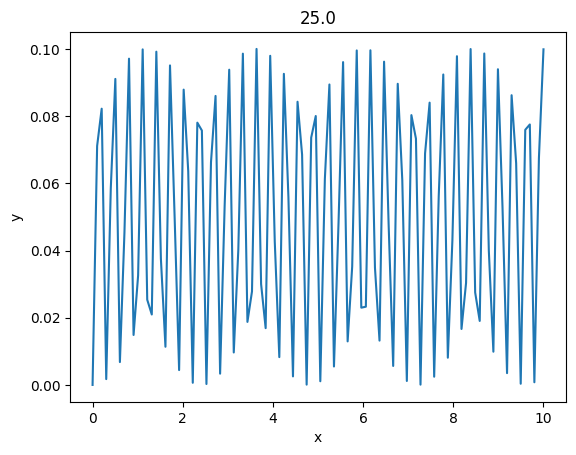

In [29]:


#T = np.linspace(0,4,int(M*sampling_rate))

fig, ax = plt.subplots()
l, = plt.plot(T,result_obs[0][:])
ax.set_ylabel('y')
ax.set_xlabel('x')
#ax.set_ylim([0,2])

def animate(i):
    l.set_data(T,result_obs[i][:])
    ax.set_title(rNN_vec[i])
ani = matplotlib.animation.FuncAnimation(fig, animate, interval=25, frames=K)

       
HTML(ani.to_jshtml())

# Frequency analysis

In [30]:
# For better frequency resolution



FFT = np.zeros((K,int(M*sampling_rate//2)))
FFTw = np.zeros((K,int(M*sampling_rate//2)))
dt = T[1]-T[0]
xf = scipy.fft.fftfreq(int(M*sampling_rate), dt)[:int(M*sampling_rate//2)]

from scipy.signal.windows import blackman
#window = blackman(T.shape[-1]//samplinsg_rate+1)

for i in range(K):
    results_sampled = result_obs[i][:]

    FFT[i,:] = 2/M/sampling_rate*np.abs(scipy.fft.fft(results_sampled)[:int(M*sampling_rate//2)])
    #FFTw[i,:] = 2/M*np.abs(scipy.fft.fft(results_sampled*window)[:M//sampling_rate//2])
    


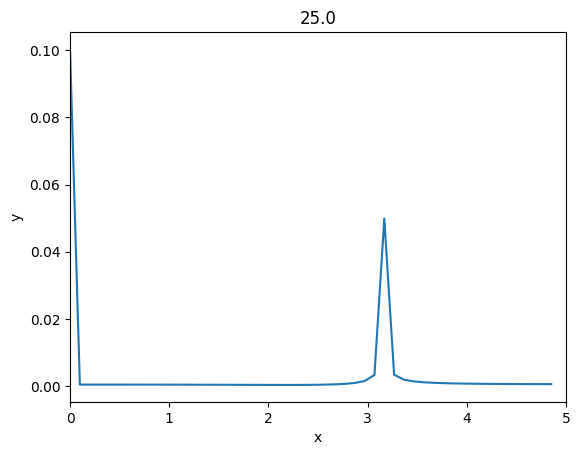

In [31]:
fig, ax = plt.subplots()
l, = plt.plot(xf,FFT[0,:])
ax.set_ylabel('y')
ax.set_xlabel('x')
#ax.set_ylim([0,0.75])
ax.set_xlim([0,5])

def animate(i):
    l.set_data(xf,FFT[i,:])
    ax.set_title(rNN_vec[i])
ani = matplotlib.animation.FuncAnimation(fig, animate, interval=100, frames=K)

       
HTML(ani.to_jshtml())

# ani.save('FFT_rNN_hexa.gif')

In [32]:
np.log(FFT[0,:])

array([-2.29834795, -7.82183288, -7.82300024, -7.82498368, -7.82783439,
       -7.83164104, -7.83648671, -7.84249326, -7.8497918 , -7.85853239,
       -7.86886746, -7.88095898, -7.8949607 , -7.91101104, -7.92920895,
       -7.94959183, -7.97208645, -7.99643993, -8.02209947, -8.04802106,
       -8.07235106, -8.09193428, -8.10161771, -8.09348196, -8.05649935,
       -7.97751906, -7.84405441, -7.6468264 , -7.37798547, -7.02169273,
       -6.53014987, -5.72217842, -2.9977981 , -5.69790928, -6.28379273,
       -6.60630289, -6.81902392, -6.97437608, -7.09161653, -7.18381623,
       -7.25787251, -7.3181603 , -7.36758549, -7.40814963, -7.44126826,
       -7.46796092, -7.48896681, -7.50481974, -7.51589652, -7.52244719])

In [33]:
print(Omega/2/np.pi*np.sqrt(n))

2.449489742783178


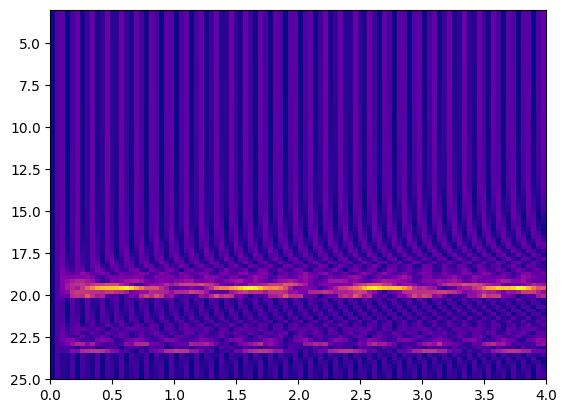

In [34]:

plt.imshow(result_obs, cmap='plasma', interpolation='nearest',extent=(0,4,25,3), aspect='auto')
plt.show()

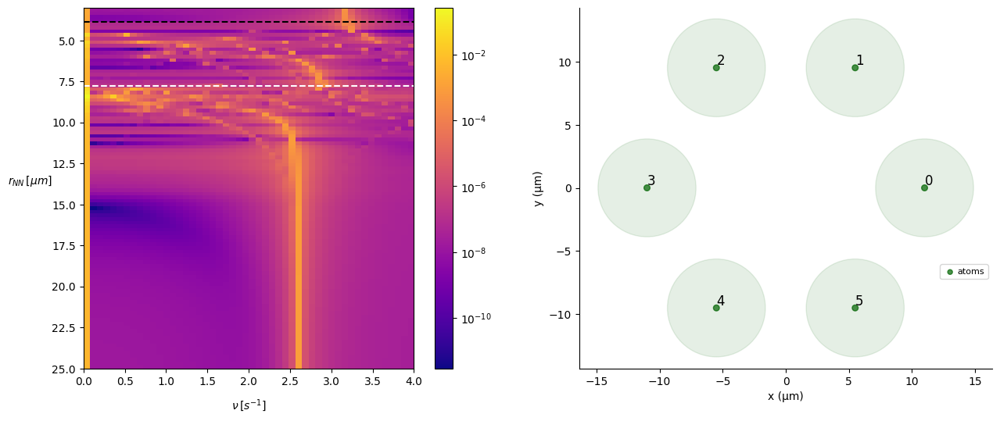

In [35]:
#fftbis = np.array([FFT[i,:],rNN_vec[i] for i in range(100)])
#print(fftbis.shape)
#fig,(ax1,ax2) = plt.subplots(1,2,figsize=(10,6))
plt.rcParams['text.usetex'] = False
fig,(ax1,ax2) = plt.subplots(1,2,figsize=(15,6))
ax1.set_ylabel(r'$r_{NN}\, [\mu m]$',rotation=0,labelpad=20)#, loc='top')
ax1.set_xlabel(r'$\nu\,[s^{-1}]$',rotation=0,labelpad=10)#, loc='right')
im = ax1.imshow(np.log(FFT[:,:]),cmap='plasma',origin='lower', interpolation='nearest', extent=(0,4,25,3), aspect='auto')
#ax2.imshow(np.log(FFTw),cmap='plasma',origin='lower', interpolation='nearest', extent=(0,4,25,0.5))
#ax1.setgrid()
ax1.set_title("")

if(MOF=="TEST"):
    rB = (U/Omega)**(1/6)
    ax1.plot([0,4],[2*rB*(np.sin(np.pi/6)),2*rB*(np.sin(np.pi/6))],'--w')
    #ax1.plot([0,4],[rB*10**(1/6),rB*10**(1/6)],'-.w')
   

    ax1.plot([0,4],[rB*(np.sin(np.pi/6)),rB*(np.sin(np.pi/6))],'--k')
    #ax1.plot([0,4],[rB*(np.sin(np.pi/4))/10**(1/6),rB*(np.sin(np.pi/4))/10**(1/6)],'-.k')


import matplotlib.ticker as ticker
def fmt(x, pos):
    #a, b = '{:.2e}'.format(x).split('e')
    #b = int(b)
    return r'$10^{{{}}}$'.format(int(x))

plt.colorbar(im, format=ticker.FuncFormatter(fmt))
#fig.colorbar(im)
#ax1.grid(alpha=0.5, linestyle='-', linewidth=1)
G1 = graph_desc(11)

qubits1 = dict(enumerate(G1))
reg1 = Register(qubits1)
reg1.draw(blockade_radius=(U/Omega)**(1/6), draw_half_radius=True, draw_graph=True,custom_ax=ax2)


plt.show()